<a href="https://colab.research.google.com/github/LucasSSales/Lista02-Visao-Computacional/blob/main/VC_Lista02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
# to run in google colab
import sys
if 'google.colab' in sys.modules:
    import subprocess
    #subprocess.call('pip install -U opencv-python'.split())
    subprocess.call('pip install opencv-python==3.4.2.16'.split())
    subprocess.call('pip install opencv-contrib-python==3.4.2.16'.split())

In [6]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from matplotlib.pyplot import figure
from sklearn.preprocessing import normalize
from matplotlib.pyplot import figure

# QUESTÃO 01

Detectores utilizados:
*   Harris
*   Shi-Tomasi
*   SUSAN



### HARRIS

O detector de Harris transforma a ideia central da analise de *corners* e a transforma em uma visão matemática, onde pegamos o somatório do cálculo do erro e aproximamos uma função utilizando séries de Taylor para chegar em:

E(u,v) = ∑x,y w(x,y) [I(x+u, y+v) - I(x,y)]^2

Onde o "erro" é calculado pela soma dos valores do pixe na janela original e pelos pixels equivalentes na janela transladada, onde um peso é multiplicado, sendo ele a distancia do pixel ao centro. Quando realizamos uma aproximação, gera:

E(u,v) ≈ [u, v] M [[u], [v]]

Sendo M = ∑x,y w(x,y) H, e H = [[Ix^2  IxIy],[IxIy  Iy^2]]

Podemos simplificar o cálculo para uma fórmula que depende apenas dos valores calculados para M:

R = det(M) - k*(trace(M))^2

Onde a determinate é calculado por λ1λ2 e o traço calculado por λ1+λ2 e λ1 e λ2 são autovalores de M

In [30]:
def harris(img):
  gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
  gray = np.float32(gray)
  dst = cv.cornerHarris(gray,2,3,0.04)
  #result is dilated for marking the corners, not important
  dst = cv.dilate(dst,None)
  # Threshold for an optimal value, it may vary depending on the image.
  img[dst>0.01*dst.max()]=[0,0,255]
  return img

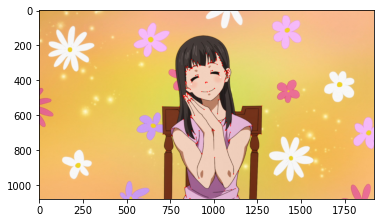

In [32]:
plt.imshow(cv.cvtColor(harris(cv.imread('maki2.jpg')),cv.COLOR_BGR2RGB))

### SHI-TOMASI

O metodo de Shi-Tomasi foi idealizado a partir do método porposto por Harris, e sugere uma pequena alteração no modo de calcular o valor de R (), onde ao invés de utilizar os valores de determinate e do traço, simplesmente o menor valor entre os autovalores da matriz é escolhido como resultado, assim:

R=min(λ1,λ2)

Onde se o resultado for maior que um certo valor de threshold, será considerado como *corner*

In [33]:
def shi_tomasi(img):
  gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
  corners = cv.goodFeaturesToTrack(gray,25,0.01,10)
  corners = np.int0(corners)
  for i in corners:
      x,y = i.ravel()
      cv.circle(img,(x,y),3,(0,0,255),-1)
  return img

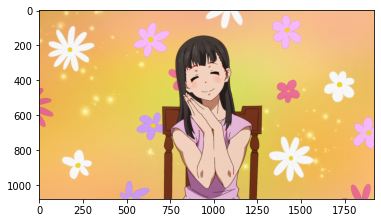

In [34]:
plt.imshow(cv.cvtColor(shi_tomasi(cv.imread('maki2.jpg')),cv.COLOR_BGR2RGB))

### SUSAN - Smallest Univalue Segment Assimilating Nucleus

A detecção de *corners* proposta em SUSAN é uma abordagem diferente das vistas em Harris e Shi-Tomasi, dessa vez a ideia é de usar uma "Mascara" ao inves de uma janela, cuja forma é "circular" (que engloba 37 pixels) e o pixel analisado é o centro, nessa mascara todos os pixels que não são o central tem seu brilho comparado ao do nucleo e, utilizando um valor de threshold, será determinado se esse pixel do meio é ou não um *corner*

Os calculos utilizados são:

c(m) = e^-(((I(m) - I(m0))/t)^6)

Onde I(m) é a intensidade de um pixel m, m0 é o núcleo e t é threshold de diferença do brilho

Depois é feito um somatório dos c (n(M)) e valor do pixel na saída será decidido por:

{ g- n(M)   se n(M) < g

{ 0         caso não seja

Onde g é o Threshold geométrico

Uma observação: dependendo dos valores atribuidos a g, o SUSAN pode acabar sendo utilizado como detector de arestas


In [35]:
# codigo utilizado foi adaptado a partir desse repositorio:
# https://github.com/rajatjain3571/Susan-Corner-Detection

def create_susan_mask():
  mask = np.ones((7,7), np.uint8)
  #zerando os 3 valores das quinas para deixar o formato mais "arredondado"
  mask[0,0], mask[0,1], mask[0,5], mask[0,6], mask[1,0], mask[1,6] = 0, 0, 0, 0, 0, 0
  mask[6,0], mask[6,1], mask[6,5], mask[6,6], mask[5,0], mask[5,6] = 0, 0, 0, 0, 0, 0
  return mask

def susan(img, t=10, g=5):
  img = img.astype(np.float64)
  mask = create_susan_mask()
  exit = img*0

  for i in range(3, len(img)-3):
    for j in range(3, len(img[i])-3):
      subm = np.array(img[i-3:i+4, j-3:j+4])
      subm = subm[mask==1] #somente os pixels equivalentes a onde for 1 na mascara
      nucleus = img[i][j] #pixel central a ser analisado
    
      c = np.exp(-((subm - nucleus)/t)**6)
      n = np.sum(c)

      if (n <= g): exit[i][j] = g-n
      else: exit[i][j] = 0
  return exit

def plot_image(image,title):
	plt.figure()

	plt.title(title)
	plt.imshow(image,cmap = 'gray')

	plt.show()

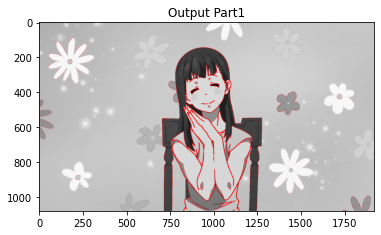

In [37]:
img=cv.imread("maki2.jpg",0)
output1 = susan(img, 10, 7)
finaloutput1 = cv.cvtColor(img, cv.COLOR_GRAY2RGB)
finaloutput1[output1 != 0] = [255, 0, 0]
plot_image(finaloutput1, "Output Part1")

# QUESTÃO 02

Descritores utilizados:
* SIFT
* ORB
* HoG

### SIFT - Scale Invariant Feature Transform

O SIFT é um descritor criado a partir da ideia do detector de Harris para torná-lo invariante a escala. O SIFT usa uma tecnica chamada "Diferença das Gaussianas", que é uma aproximação mais barata da LoG, é criada uma pirâmide gaussiana onde o pixel é comparado a sua vizinhança e a ele mesmo nas escalas proximas para determinar se ele é o melhor *keypoint* na escala. Os melhores são selecionados, depois é calculado seus gradientes e utilizados para montar histogramas.




Pegue uma janela de 16x16 pixels ao redor da feature

calcula a orientação da aresta pra cada pixel (vetor gradiente e rotaciona 90 graus)

descarte as arestas mais fracas

crie histogramas das mais fortes




consegue 



In [40]:
def sift(img):
  gray= cv.cvtColor(img,cv.COLOR_BGR2GRAY)
  sift = cv.xfeatures2d.SIFT_create()
  kp = sift.detect(gray,None)
  #img=cv.drawKeypoints(gray,kp,img)
  img=cv.drawKeypoints(gray,kp,img,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  return img

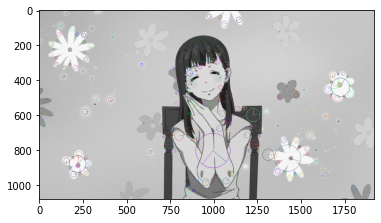

(<matplotlib.image.AxesImage at 0x7fbf1a4bc748>, None)

In [42]:
img = cv.imread('maki2.jpg')
plt.imshow(sift(img)),plt.show()

### SURF - Speeded-Up Robust Features

In [53]:
def surf(img, hess_t):
  surf = cv.xfeatures2d.SURF_create(hess_t)
  kp, des = surf.detectAndCompute(img,None)
  img2 = cv.drawKeypoints(img,kp,None,(255,0,0),4)
  return img2

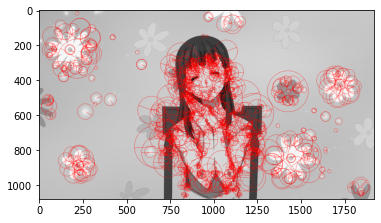

(<matplotlib.image.AxesImage at 0x7fbf1a48fef0>, None)

In [54]:
img = cv.imread('maki2.jpg',0)
img2 = surf(img, 600)
plt.imshow(img2),plt.show()

### ORB - Oriented FAST and Rotated BRIEF

ORB foi proposto como uma alternativa ao SIFT e ao SURF, devido as patentes, e funciona como um misto entre duas tecnicas: FAST para parte de detecção e BRIEF para a descrição, sendo que ORB implementa algumas melhorias nesses dois algoritmos para que corrigir seus pontos fracos.

In [7]:
def orb(img):
  orb = cv.ORB_create()
  kp, desc = orb.detectAndCompute(img,None)
  img2 = cv.drawKeypoints(img, kp, None, color=(0,255,0), flags=0)
  return img2

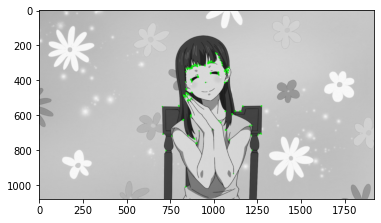

(<matplotlib.image.AxesImage at 0x7fbf1cb1e160>, None)

In [8]:
#implementação forecida pelo OpenCV
img = cv.imread('maki2.jpg',0)
img2 = orb(img)
plt.imshow(img2), plt.show()

# QUESTÃO 03

### Brute Force

Como o nome já implica, o uso da força bruta leva o algoritmo a pegar um descritor de uma feature em uma imagem e ir fazendo combinação com todos os descritores da outra imagem de modo a determinar qual o mais próximo e o retorna.

In [9]:
def brute_force(img1, img2):
  # Initiate ORB detector
  orb = cv.ORB_create()
  # find the keypoints and descriptors with ORB
  kp1, des1 = orb.detectAndCompute(img1,None)
  kp2, des2 = orb.detectAndCompute(img2,None)
  # create BFMatcher object
  bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
  # Match descriptors.
  matches = bf.match(des1,des2)
  # Sort them in the order of their distance.
  matches = sorted(matches, key = lambda x:x.distance)
  # Draw first 10 matches.
  img3 = cv.drawMatches(img1,kp1,img2,kp2,matches[:10],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  return img3

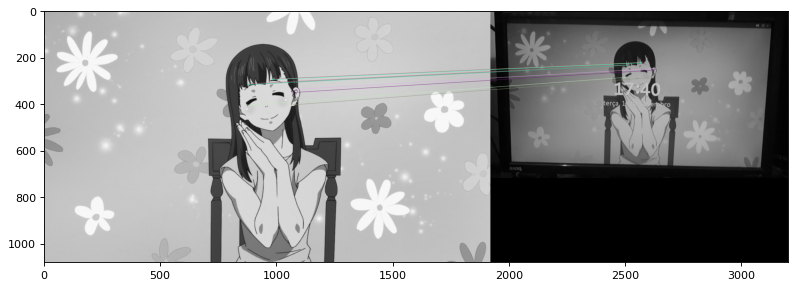

(<matplotlib.image.AxesImage at 0x7fbf1adf67b8>, None)

In [10]:
img1 = cv.imread('maki2.jpg',cv.IMREAD_GRAYSCALE)  # queryImage
img2 = cv.imread('makipc.jpg',cv.IMREAD_GRAYSCALE) # trainImage
img3 = brute_force(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

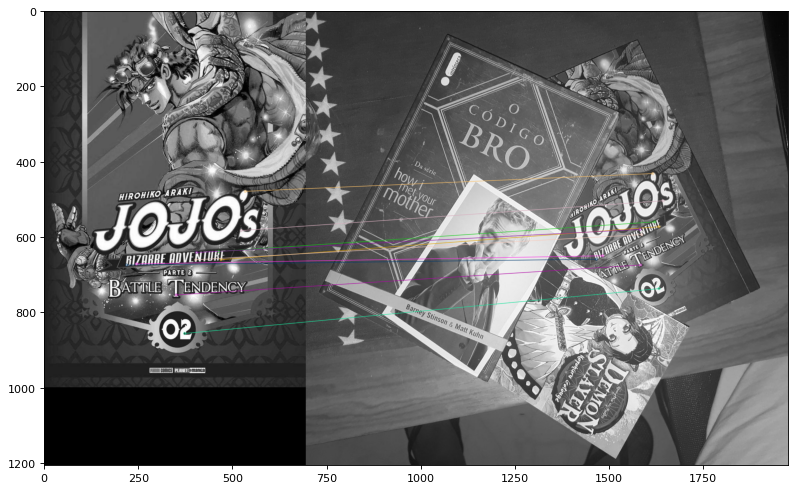

(<matplotlib.image.AxesImage at 0x7fbf1addb9b0>, None)

In [11]:
img1 = cv.imread('jojo02.jpg',cv.IMREAD_GRAYSCALE) # queryImage
img2 = cv.imread('livros.jpg',cv.IMREAD_GRAYSCALE) # trainImage
img3 = brute_force(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

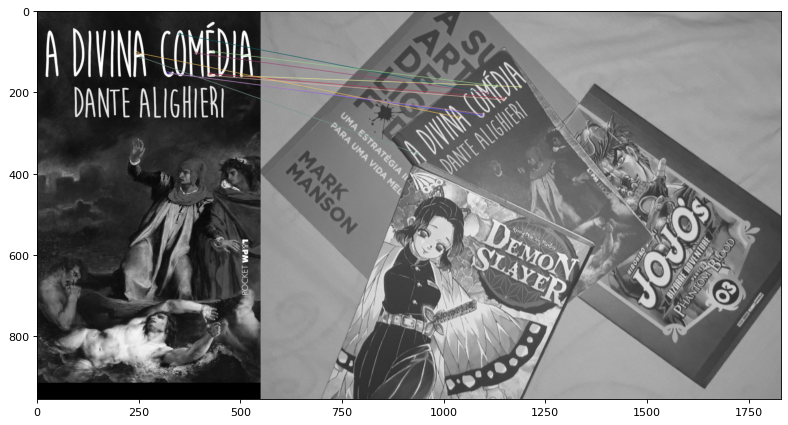

(<matplotlib.image.AxesImage at 0x7fbf1ad41278>, None)

In [12]:
img1 = cv.imread('dante.jpg',cv.IMREAD_GRAYSCALE)  # queryImage
img2 = cv.imread('livros2.jpg',cv.IMREAD_GRAYSCALE) # trainImage
img3 = brute_force(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

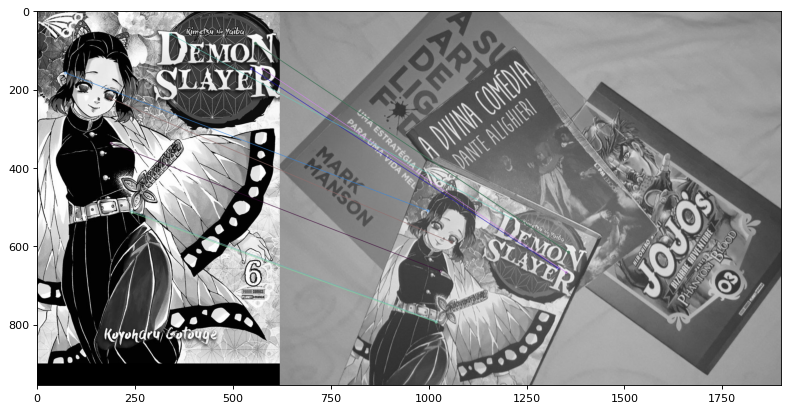

(<matplotlib.image.AxesImage at 0x7fbf1ad17f60>, None)

In [13]:
img1 = cv.imread('borboleta.jpg',cv.IMREAD_GRAYSCALE) # queryImage
img2 = cv.imread('livros2.jpg',cv.IMREAD_GRAYSCALE) # trainImage
img3 = brute_force(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

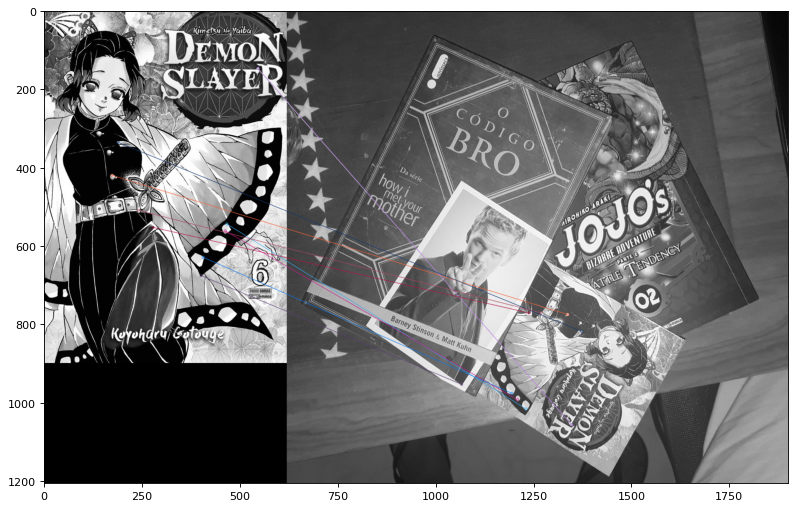

(<matplotlib.image.AxesImage at 0x7fbf1ad69198>, None)

In [14]:
img1 = cv.imread('borboleta.jpg',cv.IMREAD_GRAYSCALE) # queryImage
img2 = cv.imread('livros.jpg',cv.IMREAD_GRAYSCALE) # trainImage
img3 = brute_force(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

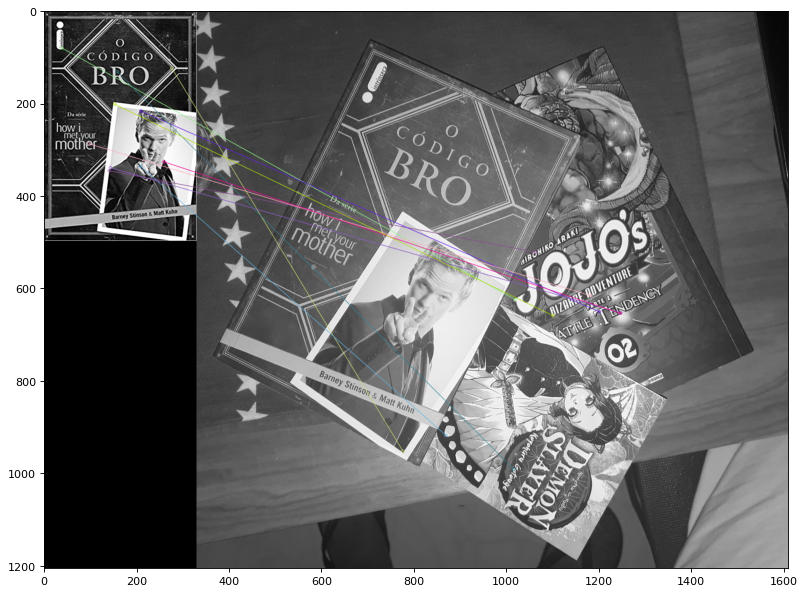

(<matplotlib.image.AxesImage at 0x7fbf1ac50ba8>, None)

In [15]:
img1 = cv.imread('brocode.jpg',cv.IMREAD_GRAYSCALE) # queryImage
img2 = cv.imread('livros.jpg',cv.IMREAD_GRAYSCALE) # trainImage
img3 = brute_force(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

### Brute Force com KNN

A técnica da força é aplicada, mas com uma implementação a mais fornecida pelo Opencv, a função de knnMatch(), que realiza uma algoritmo de KNN (K Nearest Neighbors) que vai retornar, ao inves do mais próximo, os K valores mais próximos do descritor analisado.

In [16]:
def brute_force_knn(img1, img2):
  # Initiate SIFT detector
  sift = cv.xfeatures2d.SIFT_create()
  # find the keypoints and descriptors with SIFT
  kp1, des1 = sift.detectAndCompute(img1,None)
  kp2, des2 = sift.detectAndCompute(img2,None)
  # BFMatcher with default params
  bf = cv.BFMatcher()
  matches = bf.knnMatch(des1,des2,k=2)
  # Apply ratio test
  good = []
  for m,n in matches:
      if m.distance < 0.75*n.distance:
          good.append([m])
  # cv.drawMatchesKnn expects list of lists as matches.
  img3 = cv.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  return img3

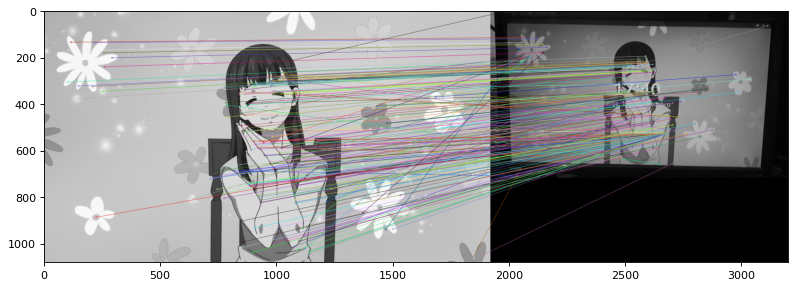

(<matplotlib.image.AxesImage at 0x7fbf1abcea90>, None)

In [17]:
img1 = cv.imread('maki2.jpg',cv.IMREAD_GRAYSCALE)  # queryImage
img2 = cv.imread('makipc.jpg',cv.IMREAD_GRAYSCALE) # trainImage

img3 = brute_force_knn(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

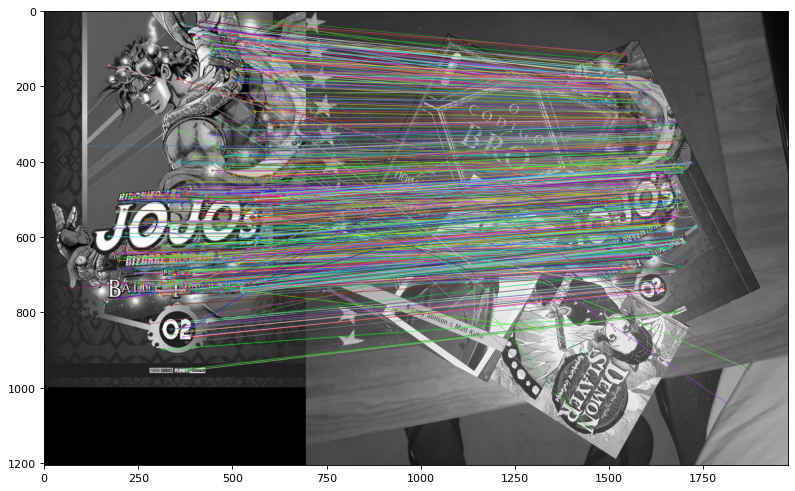

(<matplotlib.image.AxesImage at 0x7fbf1aba37b8>, None)

In [18]:
img1 = cv.imread('jojo02.jpg',cv.IMREAD_GRAYSCALE) # queryImage
img2 = cv.imread('livros.jpg',cv.IMREAD_GRAYSCALE) # trainImage

img3 = brute_force_knn(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

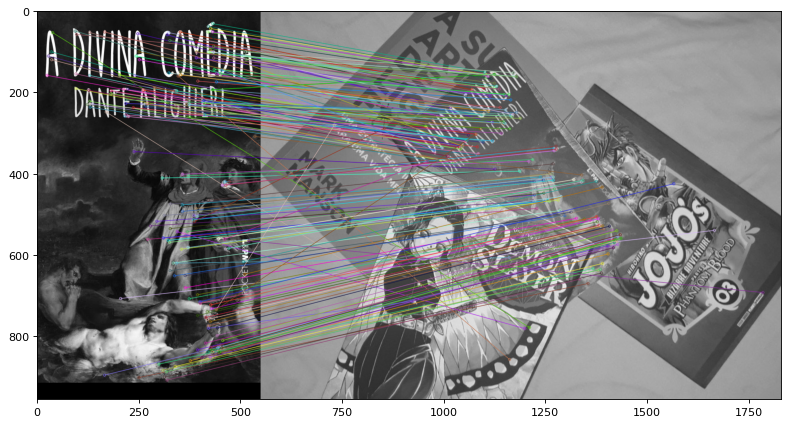

(<matplotlib.image.AxesImage at 0x7fbf1ab63358>, None)

In [19]:
img1 = cv.imread('dante.jpg',cv.IMREAD_GRAYSCALE)          # queryImage
img2 = cv.imread('livros2.jpg',cv.IMREAD_GRAYSCALE) # trainImage

img3 = brute_force_knn(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

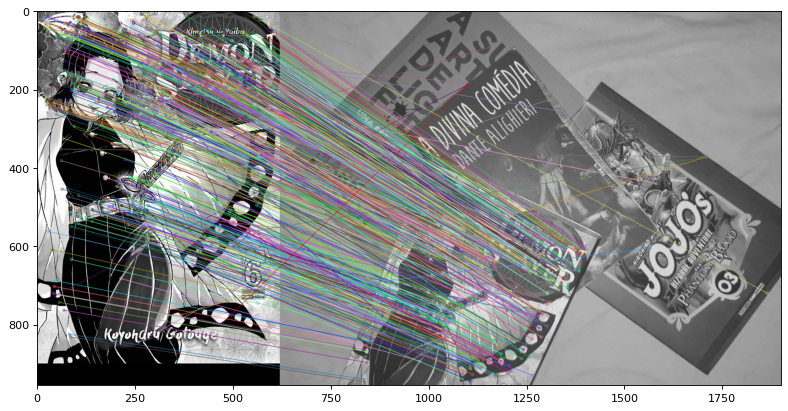

(<matplotlib.image.AxesImage at 0x7fbf1a9a5080>, None)

In [20]:
img1 = cv.imread('borboleta.jpg',cv.IMREAD_GRAYSCALE) # queryImage
img2 = cv.imread('livros2.jpg',cv.IMREAD_GRAYSCALE) # trainImage

img3 = brute_force_knn(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

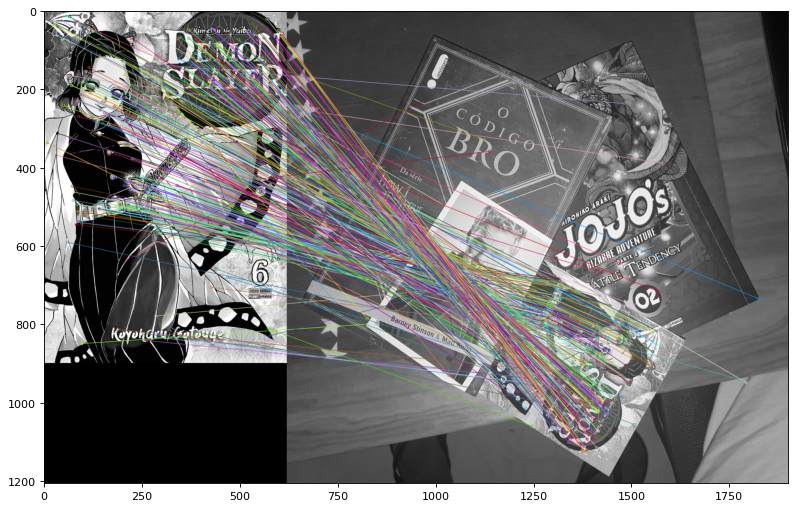

(<matplotlib.image.AxesImage at 0x7fbf1ab04d68>, None)

In [21]:
img1 = cv.imread('borboleta.jpg',cv.IMREAD_GRAYSCALE) # queryImage
img2 = cv.imread('livros.jpg',cv.IMREAD_GRAYSCALE) # trainImage

img3 = brute_force_knn(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

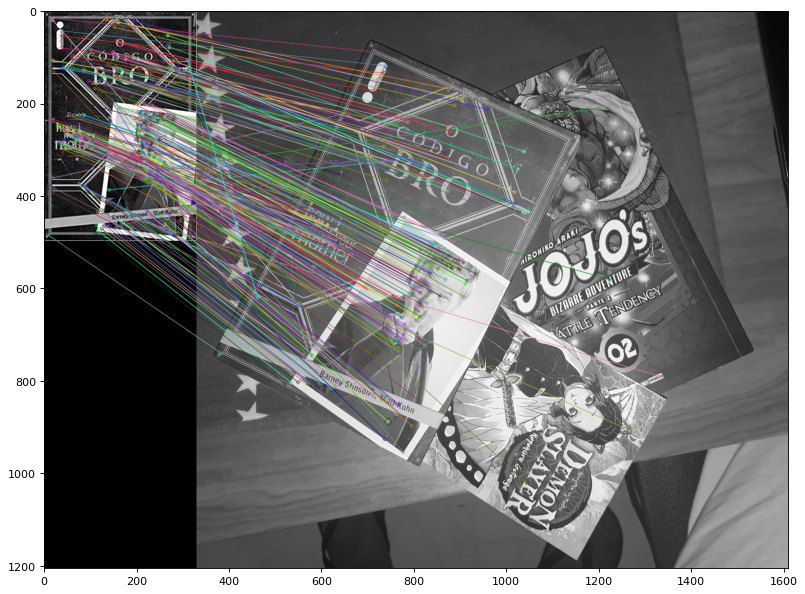

(<matplotlib.image.AxesImage at 0x7fbf1a93a630>, None)

In [22]:
img1 = cv.imread('brocode.jpg',cv.IMREAD_GRAYSCALE) # queryImage
img2 = cv.imread('livros.jpg',cv.IMREAD_GRAYSCALE) # trainImage

img3 = brute_force_knn(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

### FLANN - Fast Library for Approximate Nearest Neighbors

O FLANN é uma biblioteca otimizada para realizar as operações de KNN mais rapidamente que o método de Força Bruta e é ideal para conjuntos de dados extensos.



In [23]:
def flann(img1, img2):
  # Initiate SIFT detector
  sift = cv.xfeatures2d.SIFT_create()
  # find the keypoints and descriptors with SIFT
  kp1, des1 = sift.detectAndCompute(img1,None)
  kp2, des2 = sift.detectAndCompute(img2,None)
  # FLANN parameters
  FLANN_INDEX_KDTREE = 1
  index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
  search_params = dict(checks=50)   # or pass empty dictionary
  flann = cv.FlannBasedMatcher(index_params,search_params)
  matches = flann.knnMatch(des1,des2,k=2)
  # Need to draw only good matches, so create a mask
  matchesMask = [[0,0] for i in range(len(matches))]
  # ratio test as per Lowe's paper
  for i,(m,n) in enumerate(matches):
      if m.distance < 0.7*n.distance:
          matchesMask[i]=[1,0]
  draw_params = dict(matchColor = (0,255,0),
                    singlePointColor = (255,0,0),
                    matchesMask = matchesMask,
                    flags = cv.DrawMatchesFlags_DEFAULT)
  img3 = cv.drawMatchesKnn(img1,kp1,img2,kp2,matches,None,**draw_params)
  return img3

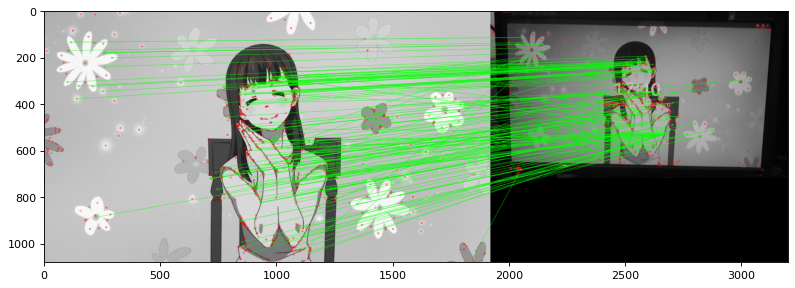

(<matplotlib.image.AxesImage at 0x7fbf1aa18550>, None)

In [24]:
img1 = cv.imread('maki2.jpg',cv.IMREAD_GRAYSCALE)  # queryImage
img2 = cv.imread('makipc.jpg',cv.IMREAD_GRAYSCALE) # trainImage
img3 = flann(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

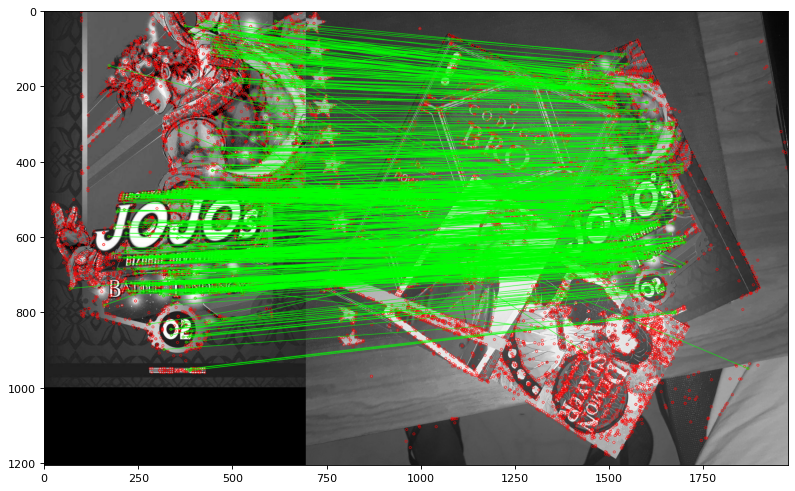

(<matplotlib.image.AxesImage at 0x7fbf1a910278>, None)

In [25]:
img1 = cv.imread('jojo02.jpg',cv.IMREAD_GRAYSCALE) # queryImage
img2 = cv.imread('livros.jpg',cv.IMREAD_GRAYSCALE) # trainImage
img3 = flann(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

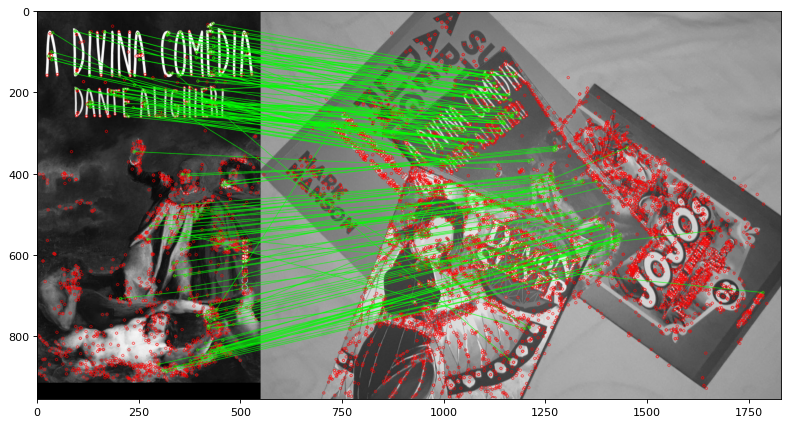

(<matplotlib.image.AxesImage at 0x7fbf1a8bcb00>, None)

In [26]:
img1 = cv.imread('dante.jpg',cv.IMREAD_GRAYSCALE)  # queryImage
img2 = cv.imread('livros2.jpg',cv.IMREAD_GRAYSCALE) # trainImage
img3 = flann(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

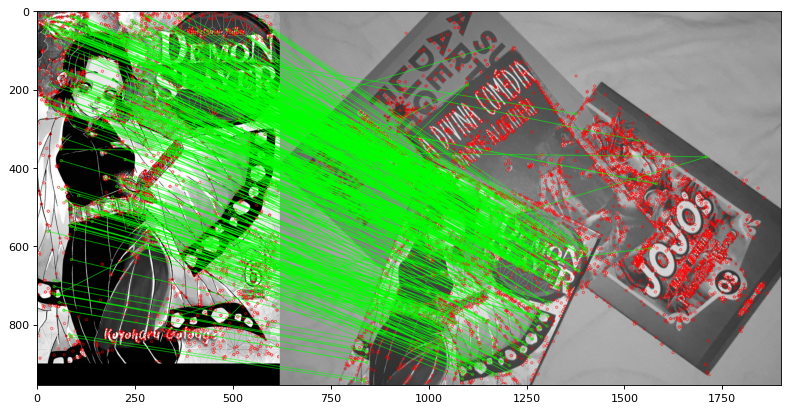

(<matplotlib.image.AxesImage at 0x7fbf1aaa85c0>, None)

In [27]:
img1 = cv.imread('borboleta.jpg',cv.IMREAD_GRAYSCALE) # queryImage
img2 = cv.imread('livros2.jpg',cv.IMREAD_GRAYSCALE) # trainImage
img3 = flann(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

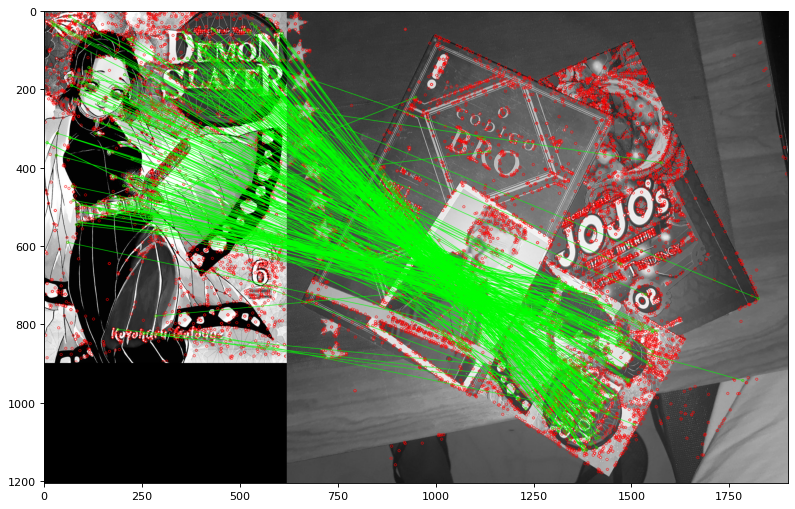

(<matplotlib.image.AxesImage at 0x7fbf1a8e8208>, None)

In [28]:
img1 = cv.imread('borboleta.jpg',cv.IMREAD_GRAYSCALE) # queryImage
img2 = cv.imread('livros.jpg',cv.IMREAD_GRAYSCALE) # trainImage
img3 = flann(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

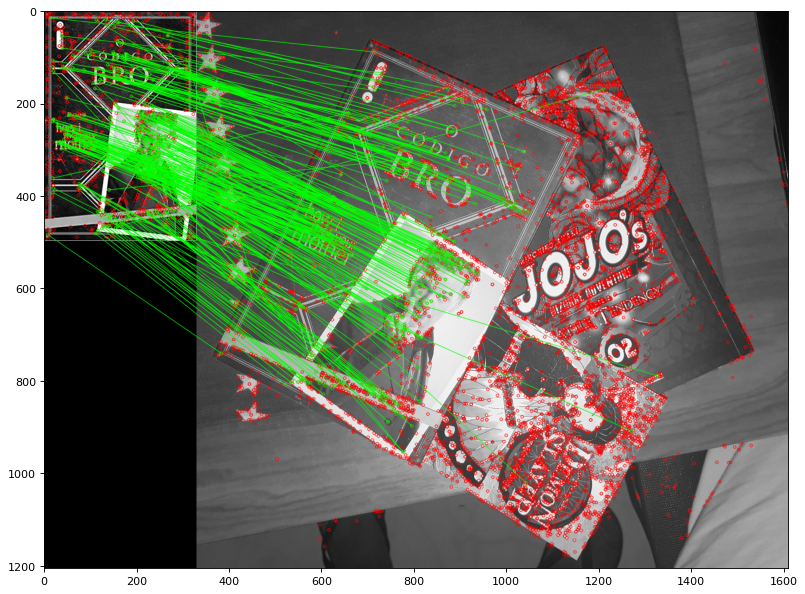

(<matplotlib.image.AxesImage at 0x7fbf1a6d7160>, None)

In [29]:
img1 = cv.imread('brocode.jpg',cv.IMREAD_GRAYSCALE) # queryImage
img2 = cv.imread('livros.jpg',cv.IMREAD_GRAYSCALE) # trainImage
img3 = flann(img1, img2)

figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(img3),plt.show()

# QUESTÃO 04

# QUESTÃO 05

Unicidade de pontos de interesse se refere a cada ponto ser único, já que na hora de fazer o *matching* entre duas imagens, dois pontos de mesmo valor poderiam confundir o programa, que faria com que ele unisse os pontos errados nas duas imagens



INSERIR EXEMPLOS

# QUESTÃO 06

In [55]:
ddepth = cv.CV_16S
kernel_size = 3
window_size = 7
scale = 0.6
colors = [ [0,0,0], [0,0,255], [0, 255, 0], [255, 0, 0],
          [255,255,0], [255, 0, 255], [0, 255, 255], [255,255,255] ]


#compara o pixel com sua vizinhança
def is_center_max(subm):
  k = subm[len(subm)//2][len(subm)//2]
  m = np.amax(subm)
  if (k != m): return False
  return True

#compara com ele mesma nas outras escalas
def comp_scales(pxl, x, y, s, pyramid):
  idx = 1
  exit = {"x": x, "y":y, "s":s}
  idx_max = 1
  for img in pyramid:
    if (img[x][y] > pxl):
      idx_max = idx
      exit = {"x": x, "y":y, "s":s**idx}
    x = int(x*s)
    y = int(y*s)
    idx += 1
  imgs[idx_max][exit["x"]][exit["y"]] = colors[idx_max]
  return (exit["x"], exit["y"], exit["s"])

In [56]:
img = cv.imread('Maki1024.jpg',0)
log = cv.Laplacian(img, ddepth, ksize=kernel_size)
log = cv.convertScaleAbs(log)
pyramid = [log]
imgs = [cv.imread('Maki1024.jpg')]

#gerando as 6 escalas
for i in range(7):
  rdcd = cv.resize(img, (int(img.shape[1]*scale), int(img.shape[0]*scale)))
  imgs.append(cv.resize(imgs[i], (int(img.shape[1]*scale), int(img.shape[0]*scale))))
  log_rdcd = cv.Laplacian(rdcd, ddepth, ksize=kernel_size)
  log_rdcd = cv.convertScaleAbs(log_rdcd)
  pyramid.append(log_rdcd)
  img = rdcd

bests = []
wndw = window_size//2
for i in range(wndw, len(pyramid[1])-wndw):
  for j in range(wndw, len(pyramid[1][i])-wndw):
    if (is_center_max(pyramid[1][i-wndw:i+wndw, j-wndw:j+wndw])):
      bests.append(comp_scales(pyramid[1][i][j], i, j, scale, pyramid[1:7]))

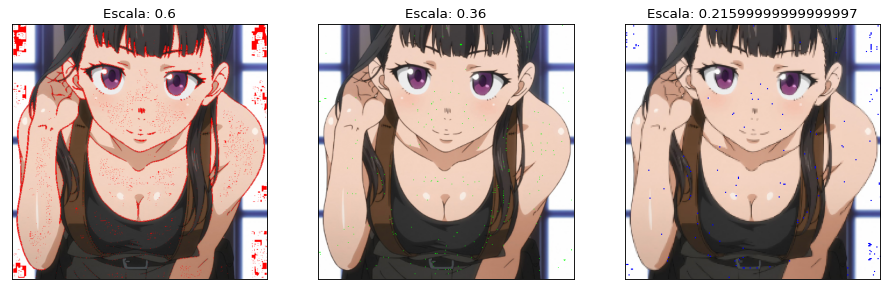

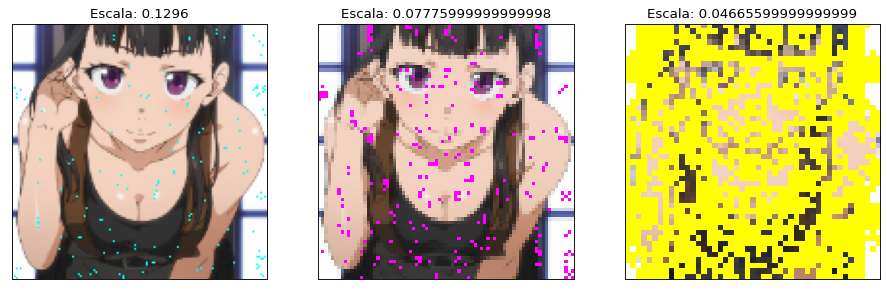

In [57]:
#PLOTS
from matplotlib.pyplot import figure
figure(num=None, figsize=(14, 10), dpi=80, facecolor='w', edgecolor='k')

m = cv.imread('Maki1024.jpg',0)

plt.subplot(131),plt.imshow(cv.cvtColor(imgs[1], cv.COLOR_BGR2RGB)),plt.title('Escala: '+str(scale))
plt.xticks([]), plt.yticks([])


plt.subplot(132),plt.imshow(cv.cvtColor(imgs[2], cv.COLOR_BGR2RGB)),plt.title('Escala: '+str(scale**2))
plt.xticks([]), plt.yticks([])


plt.subplot(133),plt.imshow(cv.cvtColor(imgs[3], cv.COLOR_BGR2RGB)),plt.title('Escala: '+str(scale**3))
plt.xticks([]), plt.yticks([])
plt.show()

figure(num=None, figsize=(14, 10), dpi=80, facecolor='w', edgecolor='k')
plt.subplot(131),plt.imshow(cv.cvtColor(imgs[4], cv.COLOR_BGR2RGB)),plt.title('Escala: '+str(scale**4))
plt.xticks([]), plt.yticks([])


plt.subplot(132),plt.imshow(cv.cvtColor(imgs[5], cv.COLOR_BGR2RGB)),plt.title('Escala: '+str(scale**5))
plt.xticks([]), plt.yticks([])


plt.subplot(133),plt.imshow(cv.cvtColor(imgs[6], cv.COLOR_BGR2RGB)),plt.title('Escala: '+str(scale**6))
plt.xticks([]), plt.yticks([])
plt.show()

# Referências Bibliográficas

https://www.learnopencv.com/histogram-of-oriented-gradients/

https://towardsdatascience.com/image-stitching-using-opencv-817779c86a83

https://github.com/rajatjain3571/Susan-Corner-Detection

https://users.fmrib.ox.ac.uk/~steve/susan/susan/node13.html

https://docs.opencv.org/3.4/df/dd2/tutorial_py_surf_intro.html